In [1]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt

In [2]:
def add_salt_and_pepper_noise(image, prob=0.05):
    noisy = np.copy(image)
    
    rand_matrix = np.random.rand(*noisy.shape)
    noisy[rand_matrix < (prob / 2)] = 0
    noisy[rand_matrix > 1 - (prob / 2)] = 255
    
    return noisy

In [3]:
def add_gaussian_noise(image, mean=0, std_dev=25):
    gauss = np.random.normal(mean, std_dev, image.shape)
    
    noisy = image.astype(float) + gauss
    
    # Clip values to valid 8-bit range [0, 255] and convert back to uint8
    noisy = np.clip(noisy, 0, 255).astype(np.uint8)
    return noisy

In [4]:
img_details = cv2.imread('./Mandrill.webp', cv2.IMREAD_GRAYSCALE)
img_smooth = cv2.imread('./Camerman.webp', cv2.IMREAD_GRAYSCALE)

In [5]:
img_details = cv2.resize(img_details, (512, 512))
img_smooth = cv2.resize(img_smooth, (512, 512))

noisy_details = add_salt_and_pepper_noise(img_details, prob=0.05)
noisy_smooth = add_gaussian_noise(img_smooth, mean=0, std_dev=25)

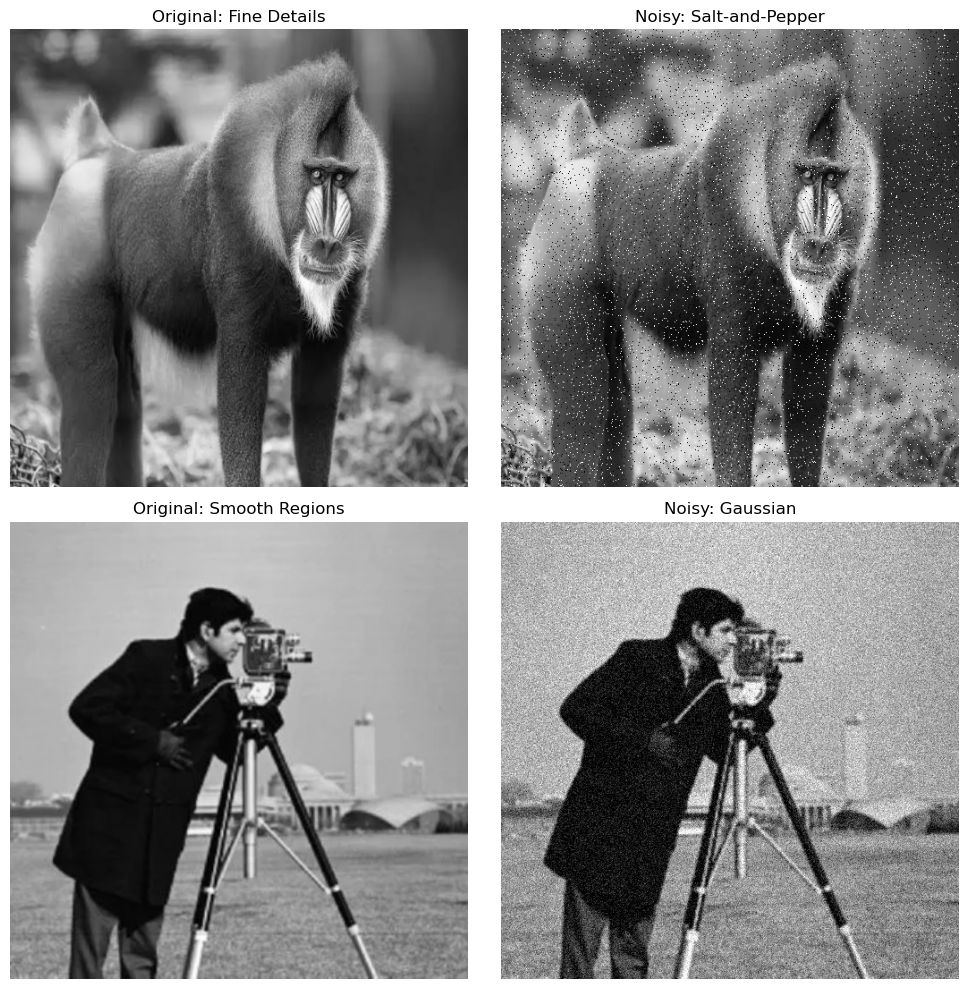

In [6]:
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

axes[0, 0].imshow(img_details, cmap='gray')
axes[0, 0].set_title("Original: Fine Details")
axes[0, 0].axis('off')

axes[0, 1].imshow(noisy_details, cmap='gray')
axes[0, 1].set_title("Noisy: Salt-and-Pepper")
axes[0, 1].axis('off')

axes[1, 0].imshow(img_smooth, cmap='gray')
axes[1, 0].set_title("Original: Smooth Regions")
axes[1, 0].axis('off')

axes[1, 1].imshow(noisy_smooth, cmap='gray')
axes[1, 1].set_title("Noisy: Gaussian")
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

In [7]:
def apply_filter_scratch(image, kernel):
    k_h, k_w = kernel.shape
    pad_h, pad_w = k_h // 2, k_w // 2
    
    padded_img = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    output = np.zeros_like(image, dtype=np.float32)
    
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_img[i:i+k_h, j:j+k_w]
            output[i, j] = np.sum(region * kernel)
            
    return np.clip(output, 0, 255).astype(np.uint8)

def get_box_kernel(size):
    return np.ones((size, size), dtype=np.float32) / (size * size)

def get_weighted_kernel(size):
    center = size // 2
    kernel = np.zeros((size, size), dtype=np.float32)
    for i in range(size):
        for j in range(size):
            dist = np.sqrt((i - center)**2 + (j - center)**2)
            kernel[i, j] = 1.0 / (dist + 1)
    return kernel / np.sum(kernel)

In [8]:
kernel_sizes = [3, 5, 7]
images = {
    "S&P Noisy (Details)": noisy_details, 
    "Gaussian Noisy (Smooth)": noisy_smooth
}

filters = ['Box', 'Weighted', 'Gaussian', 'Median']

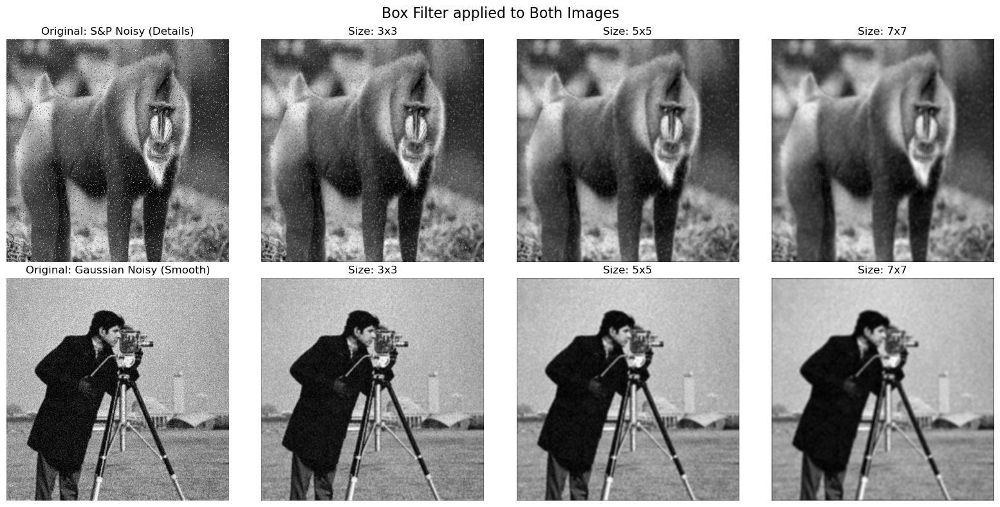

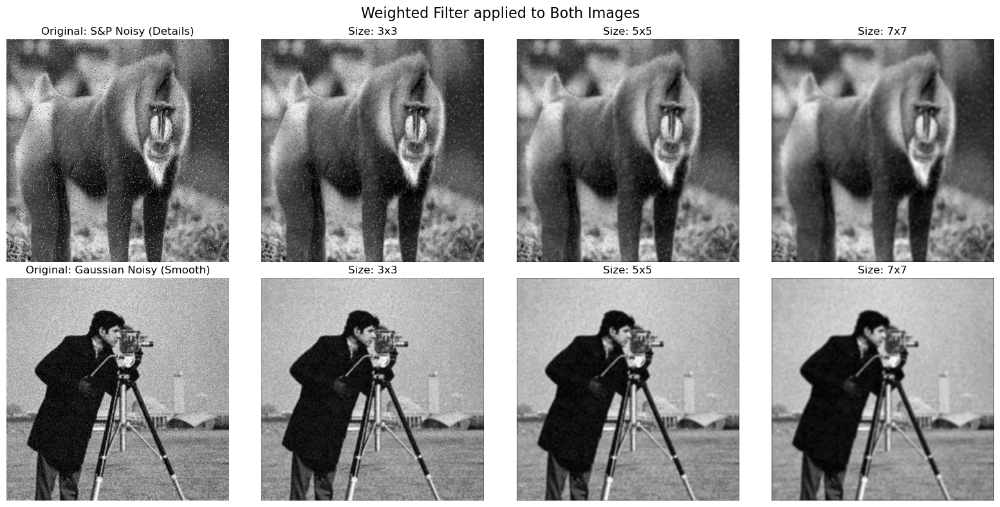

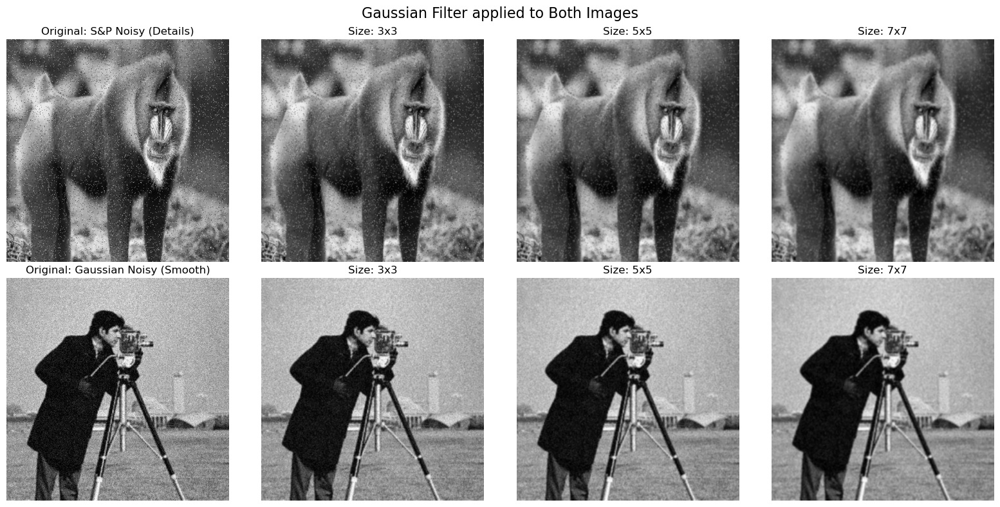

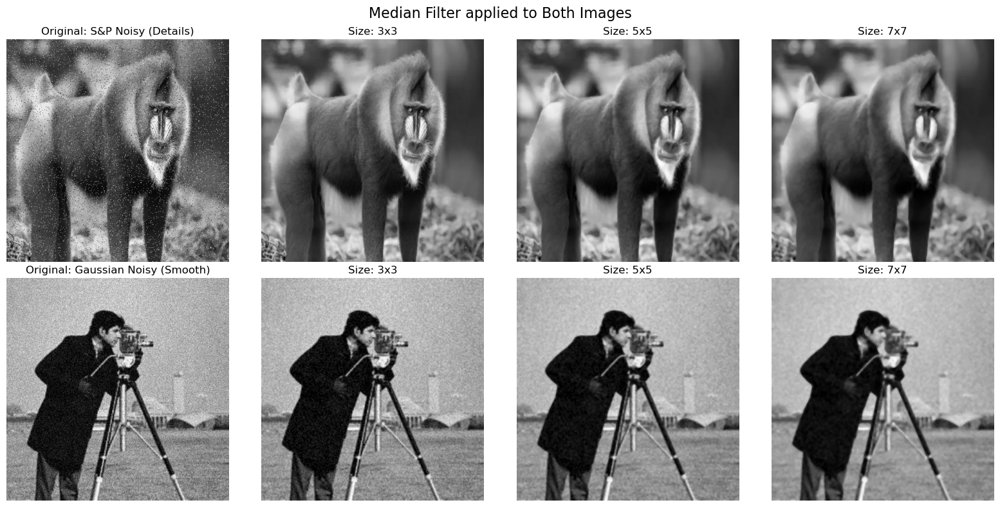

In [9]:
for filter_name in filters:
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f"{filter_name} Filter applied to Both Images", fontsize=16)
    
    for row_idx, (img_title, img_data) in enumerate(images.items()):
        axes[row_idx, 0].imshow(img_data, cmap='gray')
        axes[row_idx, 0].set_title(f"Original: {img_title}")
        axes[row_idx, 0].axis('off')
        
        for col_idx, k_size in enumerate(kernel_sizes):
            if filter_name == 'Box':
                filtered = apply_filter_scratch(img_data, get_box_kernel(k_size))
            elif filter_name == 'Weighted':
                filtered = apply_filter_scratch(img_data, get_weighted_kernel(k_size))
            elif filter_name == 'Gaussian':
                filtered = cv2.GaussianBlur(img_data, (k_size, k_size), 0)
            elif filter_name == 'Median':
                filtered = cv2.medianBlur(img_data, k_size)
                
            axes[row_idx, col_idx + 1].imshow(filtered, cmap='gray')
            axes[row_idx, col_idx + 1].set_title(f"Size: {k_size}x{k_size}")
            axes[row_idx, col_idx + 1].axis('off')
            
    plt.tight_layout()
    plt.show()

In [10]:
stored_results = {
    "S&P (Details)": {"original": img_details, "noisy": noisy_details, "filtered": {}},
    "Gaussian (Smooth)": {"original": img_smooth, "noisy": noisy_smooth, "filtered": {}}
}

In [11]:
for img_name, data in stored_results.items():
    for f_name in filters:
        data["filtered"][f_name] = {}
        for k in kernel_sizes:
            if f_name == 'Box':
                res = apply_filter_scratch(data["noisy"], get_box_kernel(k))
            elif f_name == 'Weighted':
                res = apply_filter_scratch(data["noisy"], get_weighted_kernel(k))
            elif f_name == 'Gaussian':
                res = cv2.GaussianBlur(data["noisy"], (k, k), 0)
            elif f_name == 'Median':
                res = cv2.medianBlur(data["noisy"], k)
            
            data["filtered"][f_name][k] = res

In [12]:
metrics_data = []

def calculate_mse(original, reconstructed):
    return np.mean((original.astype(np.float64) - reconstructed.astype(np.float64)) ** 2)

def calculate_psnr(original, reconstructed):
    mse = calculate_mse(original, reconstructed)
    return float('inf') if mse == 0 else 10 * np.log10((255.0 ** 2) / mse)

for img_name, data in stored_results.items():
    for f_name in filters:
        for k in kernel_sizes:
            filtered_img = data["filtered"][f_name][k]
            mse = calculate_mse(data["original"], filtered_img)
            psnr = calculate_psnr(data["original"], filtered_img)
            metrics_data.append([img_name, f_name, f"{k}x{k}", round(mse, 2), round(psnr, 2)])

In [13]:
df_metrics = pd.DataFrame(metrics_data, columns=["Image Type", "Filter", "Kernel Size", "MSE", "PSNR (dB)"])
print(df_metrics.to_string(index=False))

       Image Type   Filter Kernel Size    MSE  PSNR (dB)
    S&P (Details)      Box         3x3 152.44      26.30
    S&P (Details)      Box         5x5 119.42      27.36
    S&P (Details)      Box         7x7 132.37      26.91
    S&P (Details) Weighted         3x3 155.53      26.21
    S&P (Details) Weighted         5x5 109.56      27.73
    S&P (Details) Weighted         7x7 113.74      27.57
    S&P (Details) Gaussian         3x3 161.91      26.04
    S&P (Details) Gaussian         5x5 110.01      27.72
    S&P (Details) Gaussian         7x7  91.04      28.54
    S&P (Details)   Median         3x3  25.71      34.03
    S&P (Details)   Median         5x5  45.43      31.56
    S&P (Details)   Median         7x7  60.49      30.31
Gaussian (Smooth)      Box         3x3  97.85      28.23
Gaussian (Smooth)      Box         5x5 106.16      27.87
Gaussian (Smooth)      Box         7x7 166.28      25.92
Gaussian (Smooth) Weighted         3x3  97.27      28.25
Gaussian (Smooth) Weighted     

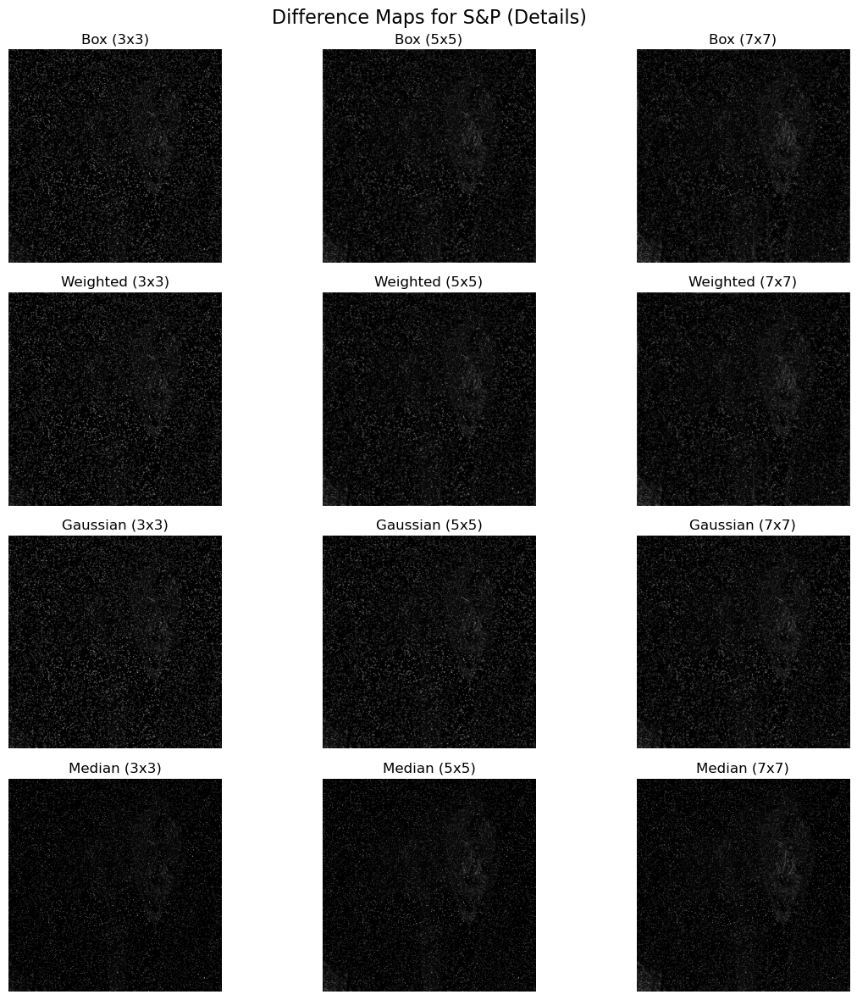

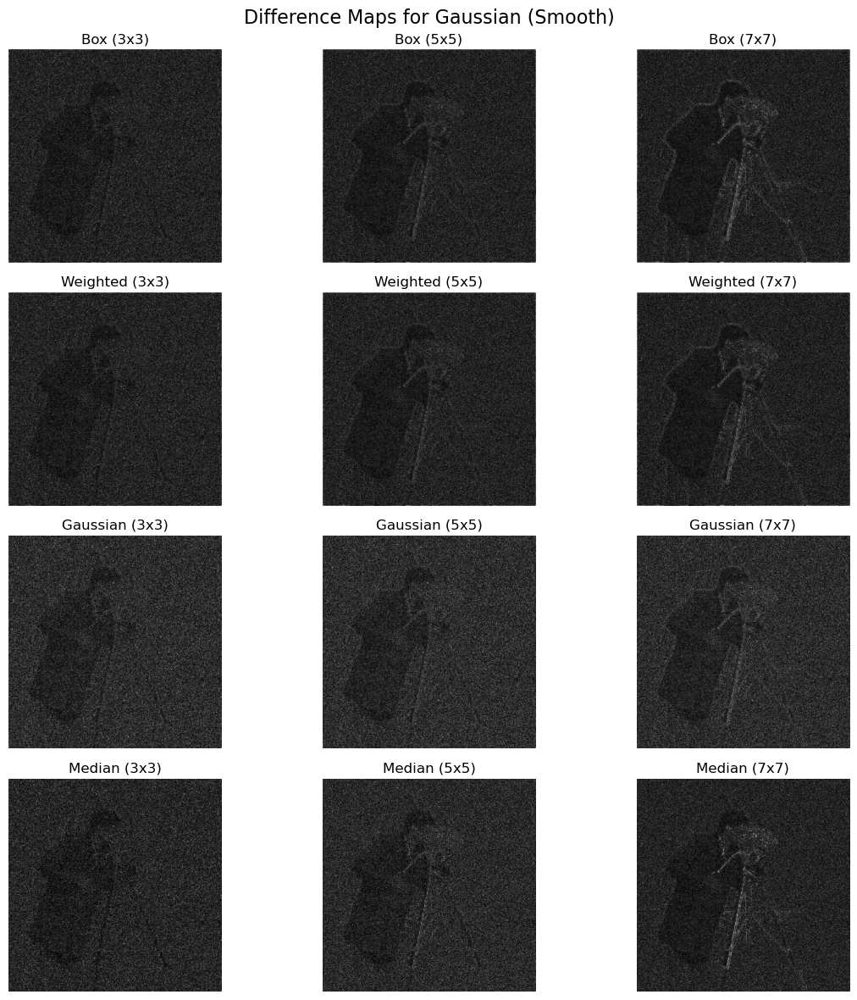

In [14]:
for img_name, data in stored_results.items():
    fig, axes = plt.subplots(4, 3, figsize=(12, 12))
    fig.suptitle(f"Difference Maps for {img_name}", fontsize=16)
    
    for row_idx, f_name in enumerate(filters):
        for col_idx, k in enumerate(kernel_sizes):
            filtered_img = data["filtered"][f_name][k]
            
            diff_map = np.abs(data["noisy"].astype(float) - filtered_img.astype(float)).astype(np.uint8)
            
            axes[row_idx, col_idx].imshow(diff_map, cmap='gray')
            axes[row_idx, col_idx].set_title(f"{f_name} ({k}x{k})")
            axes[row_idx, col_idx].axis('off')
            
    plt.tight_layout()
    plt.show()

In [18]:
midpoint = img_smooth.shape[1] // 2
mixed_noisy = np.copy(img_smooth)
mixed_noisy[:, :midpoint] = noisy_details[:, :midpoint]
mixed_noisy[:, midpoint:] = noisy_smooth[:, midpoint:]

In [19]:
k = 5
global_box = apply_filter_scratch(mixed_noisy, get_box_kernel(k))
global_weighted = apply_filter_scratch(mixed_noisy, get_weighted_kernel(k))
global_gauss = cv2.GaussianBlur(mixed_noisy, (k, k), 0)
global_median = cv2.medianBlur(mixed_noisy, k)

In [21]:
left_half = mixed_noisy[:, :midpoint]
right_half = mixed_noisy[:, midpoint:]

repaired_left = cv2.medianBlur(left_half, k)
repaired_right = cv2.GaussianBlur(right_half, (k, k), 0)

region_wise_result = np.hstack((repaired_left, repaired_right))

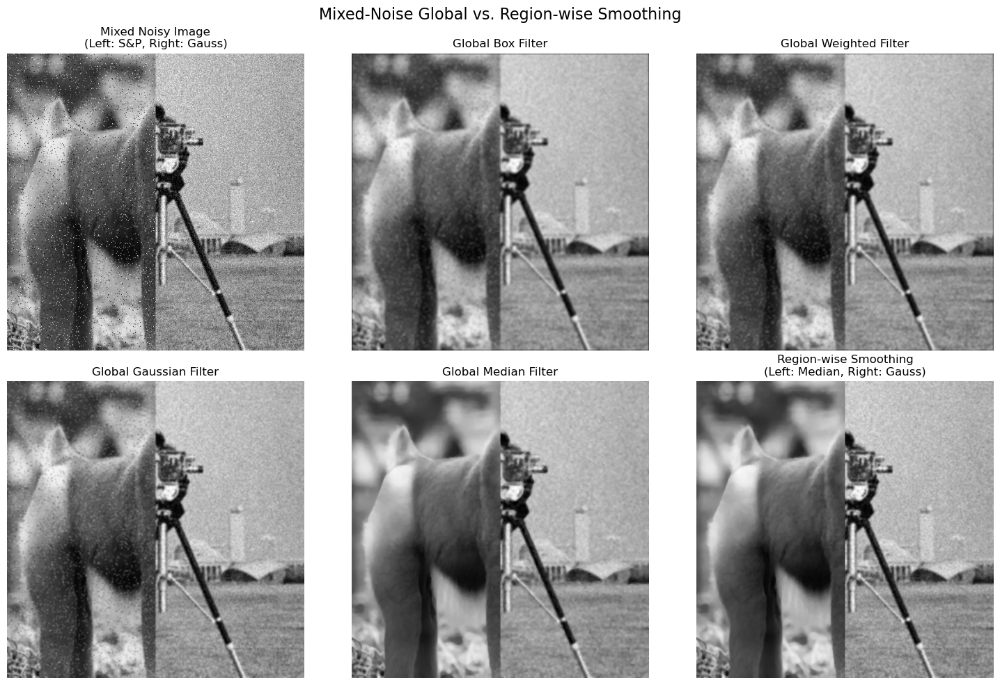

In [22]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle("Mixed-Noise Global vs. Region-wise Smoothing", fontsize=16)

axes[0, 0].imshow(mixed_noisy, cmap='gray')
axes[0, 0].set_title("Mixed Noisy Image\n(Left: S&P, Right: Gauss)")
axes[0, 0].axis('off')

axes[0, 1].imshow(global_box, cmap='gray')
axes[0, 1].set_title("Global Box Filter")
axes[0, 1].axis('off')

axes[0, 2].imshow(global_weighted, cmap='gray')
axes[0, 2].set_title("Global Weighted Filter")
axes[0, 2].axis('off')

axes[1, 0].imshow(global_gauss, cmap='gray')
axes[1, 0].set_title("Global Gaussian Filter")
axes[1, 0].axis('off')

axes[1, 1].imshow(global_median, cmap='gray')
axes[1, 1].set_title("Global Median Filter")
axes[1, 1].axis('off')

axes[1, 2].imshow(region_wise_result, cmap='gray')
axes[1, 2].set_title("Region-wise Smoothing\n(Left: Median, Right: Gauss)")
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()